In [1]:
using Flux, MLDatasets, ImageCore, StatsBase
using MLDatasets: MNIST
using Flux: train!, update!
using Flux: onehot, throttle, crossentropy, relu, sigmoid
using StatsBase: sample

In [2]:
using Plots
using Clustering
using JLD

In [52]:
using Flux
using Flux: Data.DataLoader
using Flux: onehotbatch, onecold, crossentropy
using Flux: @epochs
using Statistics
using MLDatasets

# load full training set
train_x, train_y = MNIST.traindata();

train_x_vec = [vec(train_x[:, :, i]) for i = 1:60000];
train_y_hot = [onehot(train_y[i], 0:9) for i = 1:60000];

# load full test set
test_x,  test_y  = MNIST.testdata();

test_x_vec = [vec(test_x[:, :, i]) for i = 1:10000];
test_y_hot = [onehot(test_y[i], 0:9) for i = 1:10000];

traindata = [(train_x_vec[i], train_y_hot[i]) for i = 1:60000];
testdata = [(test_x_vec[i], test_y_hot[i]) for i = 1:10000];

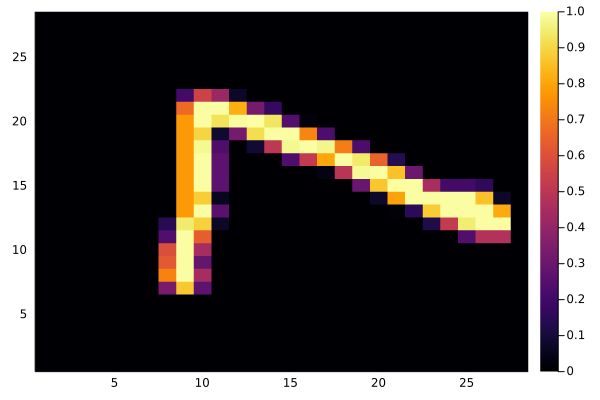

In [53]:
gr()
heatmap(test_x[:, :, 1])

In [54]:
## Train final linear layer with random standard neural network
## Train final linear layer with random convolutional neural network
## Hopefully the second one has a lower loss on average (If not need to rethink some things)
## Train a standard neural network parametrized by a linear function of each layers weights
## Evolve the linear parametrization using an evolutionary algorithm where the fitness is the average loss 
## after training of n (=10?) input parameters. Can the parameters of the linear reparameterization model
## be sparsified?

In [55]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct AffineModelReparam
    models::Any # maybe change this type to Array{Any}
    num_models::Int64
    reparams::Matrix{Float64}
    A::Matrix{Float64}
    b::Vector{Float64}
end

function AffineModelReparam(
        model::Any,
        num_models::Int64,
        variance::Float64,
        num_params::Int64,
        num_reparams::Int64
    )
    A = 1/10*randn((num_params, num_reparams))
    b = zeros((num_params))

    params, restruct = Flux.destructure(model)

    models = Vector{Any}(undef, num_models);
    reparams = variance*(randn(num_models, num_reparams));

    for i in 1:num_models
        models[i] = restruct(A*reparams[i, :] + b)
    end
    return AffineModelReparam(models, num_models, reparams, A, b)
end

# Overload call, so the object can be used as a function
function (m::AffineModelReparam)(x)
    model_id = rand(1:m.num_models)
    model = m.models[model_id]
    
    params, restruct = Flux.destructure(model)

    reparam_model = restruct(m.A*m.reparams[model_id, :] + m.b)
    return reparam_model(x)
end

In [56]:
# models could be a list of models with the same structure but different parameters
# then in the function call I could choose a random model from the list and apply the
# reparameterization to that model
# To implement a todo above, I could make A trainable but make it a scalar value and add it to the loss
mutable struct AffineModelReparamRandomFamily
    models::Any # maybe change this type to Array{Any}
    num_models::Int64
    reparams::Matrix{Float64}
    A::Matrix{Float64}
    b::Vector{Float64}
    variance::Float64
end

function AffineModelReparamRandomFamily(
        model::Any,
        num_models::Int64,
        model_variance::Float64,
        family_variance::Float64,
        num_params::Int64,
        num_reparams::Int64
    )
    A = zeros((num_params, num_reparams))
    b = zeros((num_params))

    params, restruct = Flux.destructure(model)

    models = Vector{Any}(undef, num_models);
    reparams = model_variance*(randn(num_models, num_reparams));

    for i in 1:num_models
        models[i] = restruct(A*reparams[i, :] + b)
    end
    return AffineModelReparamRandomFamily(models, num_models, reparams, A, b, family_variance)
end


# Overload call, so the object can be used as a function
function (m::AffineModelReparamRandomFamily)(x)
    model_id = rand(1:m.num_models)
    model = m.models[model_id]
    
    params, restruct = Flux.destructure(model)
    
    random_A = randn(size(m.A));
    random_b = randn(size(m.b));

    reparam_model = restruct((m.A + m.variance*random_A)*m.reparams[model_id, :] + (m.b)) #+ m.variance*random_b))
    return reparam_model(x)
end

In [57]:
mutable struct DenseRandomFamily
    shared_weights::Matrix{Float64}
    shared_biases::Vector{Float64}
    func::Function
    variance::Float64
    rand_prob::Float64
end

function DenseRandomFamily(
        input_size::Int64,
        output_size::Int64,
        func::Function,
        variance::Float64,
        rand_prob::Float64
    )
    shared_weights = zeros((output_size, input_size));
    shared_biases = zeros(output_size);
    
    return DenseRandomFamily(
        shared_weights,
        shared_biases,
        func,
        variance,
        rand_prob
    )
end

# Overload call, so the object can be used as a function
# Note that if input_params will not be differentiated, the result of
# the parameter multiplication can be stored and does not need to be constantly recomputed
#(m::DenseFamily)(x) = m.func.((m.model_weights + m.shared_weights) * x + (m.model_biases + m.shared_biases))
function (m::DenseRandomFamily)(x)
    if rand(Float64) < rand_prob
        model_weights = m.variance*(randn(size(m.shared_weights)));
        model_biases = m.variance*(randn(size(m.shared_biases)));
    else
        model_weights = zeros(size(m.shared_weights));
        model_biases = zeros(size(m.shared_biases));
    end
    return m.func.((model_weights + m.shared_weights) * x + (model_biases + m.shared_biases))
end

In [85]:
input_size = 784;
output_size = 16;

In [86]:
model = Chain(
    Dense(input_size, output_size),#, relu),
    Dense(output_size, 10),
    softmax
)
params, re = Flux.destructure(model)
size(params)[1]

12730

In [60]:
num_models = 100
model_variance = 1/5
family_variance = 1/100
num_params = size(params)[1]
num_reparams = 3

3

In [61]:
affine_model = AffineModelReparamRandomFamily(model, 100, model_variance, family_variance, num_params, num_reparams)

AffineModelReparamRandomFamily(Any[Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax)  …  Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax), Chain(Dense(784, 32), Dense(32, 10), softmax)], 100, [0.1545761828283

In [62]:
Flux.trainable(affine_model::AffineModelReparamRandomFamily) = (affine_model.A,) #affine_model.b,)
Flux.params(affine_model)

Params([[0.0 0.0 0.0; 0.0 0.0 0.0; … ; 0.0 0.0 0.0; 0.0 0.0 0.0]])

In [63]:
variance = 1/10
rand_prob = 1.0

hidden_layer1 = DenseRandomFamily(input_size, output_size, relu, variance, rand_prob)
hidden_layer2 = DenseRandomFamily(output_size, output_size, relu, variance, rand_prob)
output_layer = DenseRandomFamily(output_size, 10,  x -> x, variance, rand_prob)

Flux.trainable(hidden_layer::DenseRandomFamily) = (hidden_layer.shared_weights, hidden_layer.shared_biases,)
Flux.trainable(output_layer::DenseRandomFamily) = (output_layer.shared_weights, output_layer.shared_biases,)

family_model = Chain(
  hidden_layer1,
  hidden_layer2,
  output_layer,
  softmax
)

Chain(DenseRandomFamily([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], NNlib.relu, 0.1, 1.0), DenseRandomFamily([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], NNlib.relu, 0.1, 1.0), DenseRandomFamily([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], var"#41#42"(), 0.1, 1.0), softmax)  # 26_506 parameters  (all zero)

In [64]:
#num_hidden_layers = 1


#ps_hidden = Flux.params(data_model(input_params, b_param)[1:num_hidden_layers])
#ps_out = Flux.params(data_model(input_params)[num_hidden_layers+1:end])
#ps = Flux.params(data_model(input_params))

In [87]:
standard_model = Chain(
    Dense(input_size, output_size, relu),
    Dense(output_size, 10),
    softmax
)
ps = Flux.params(standard_model)

Params([Float32[0.005379808 0.05570407 … 0.08413944 -0.06951619; 0.06912574 -0.026044765 … -0.061536863 0.05286233; … ; -0.046964515 0.054283716 … 0.01875284 -0.07662739; 0.069177754 0.018173529 … 0.029146248 0.043822497], Float32[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Float32[-0.46368423 -0.231459 … -0.018893294 -0.057951655; 0.35107398 0.21117723 … -0.28136143 -0.39584774; … ; 0.05821565 -0.20899379 … -0.124460496 -0.20101053; 0.17011845 0.4615797 … -0.23910418 -0.20124474], Float32[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]])

In [88]:
# TODO
# Redefine the loss function to accept a set of parameter values (not totally sure the loss can be defined this way) 
# where the final loss will be an average of the loss of each model defined by the elements of the set of parameters


In [89]:
data_model = standard_model

Chain(
  Dense(784, 16, relu),                 # 12_560 parameters
  Dense(16, 10),                        # 170 parameters
  NNlib.softmax,
)                   # Total: 4 arrays, 12_730 parameters, 49.977 KiB.

In [90]:
function loss(x, y)
    loss = 0
    num = 1
    for i = 1:num
        loss += Flux.Losses.crossentropy(data_model(x), y)
    end
    return loss/num
end
accuracy(x, y) = mean(onecold.(x) .== onecold.(y))

accuracy (generic function with 1 method)

In [91]:
#loss(x, y) = Flux.Losses.crossentropy(data_model(x), y)
opt = ADAM(.001)
ps = Flux.params(data_model)

# I can just unroll the update!
# function and write out the parameter updates myself, so that all parameters are updated in the same way.

# TODO
# Should maybe look into the variance chosen specially for feedforward models implemented in Flux
num_runs = 1
for j in 1:num_runs
    trainsample = sample(traindata, 1000, replace=false);

    epochs = 200
    for epoch in 1:epochs
        loss_total = 0
        for (i, d) in enumerate(trainsample)

            # TODO
            # Choose small random sub sample from n sample above and provide to the loss function
            gs = gradient(ps) do
              training_loss = loss(d...)
              # Code inserted here will be differentiated, unless you need that gradient information
              # it is better to do the work outside this block.
              return training_loss
            end
            loss_total += loss(d...)
            if i%500==0
                println(loss_total/i)
            end
            # Insert whatever code you want here that needs training_loss, e.g. logging.
            # logging_callback(training_loss)
            # Insert what ever code you want here that needs gradient.
            # E.g. logging with TensorBoardLogger.jl as histogram so you can see if it is becoming huge.
            update!(opt, ps, gs)
        end
        println(epoch)
    end
    #testing_model = Chain(
    #    Dense(input_size, output_size, relu, init=(out, in)->ps[1], bias=ps[2]),
    #    Dense(input_size, output_size, relu, init=(out, in)->ps[3], bias=ps[4]),
    #    Dense(output_size, 10, init=(out, in)->ps[5], bias=ps[6]),
    #    softmax
    #)
    #params, restruct = Flux.destructure(data_model.models[1])
    #testing_model = restruct(data_model.b)
    print("NUMBER OF RUNS: ")
    println(j)
    #print("ACCURACY: ")
    #println(accuracy(testing_model.(test_x_vec), test_y_hot))
end

1.6287726
1.1994665
1
0.5730309
0.4812038
2
0.38134715
0.32784703
3
0.27686316
0.24017705
4
0.2051196
0.17635778
5
0.15202588
0.1292178
6
0.110298514
0.09310482
7
0.079386935
0.06508033
8
0.055072427
0.045093484
9
0.03782356
0.031086657
10
0.026174633
0.021747196
11
0.02376874
0.018866982
12
0.011435829
0.009623374
13
0.008462794
0.007090024
14
0.0057557314
0.004885545
15
0.009310411
0.00714521
16
0.020110574
0.018011121
17
0.009698319
0.006610907
18
0.0026982648
0.0021740699
19
0.0014971227
0.0013431708
20
0.0010839377
0.0009980925
21
0.0008465449
0.0007875589
22
0.0006792549
0.00061348523
23
0.00053052086
0.0004739155
24
0.019934505
0.011061521
25
0.00073036994
0.0010416335
26
0.00059990387
0.000552589
27
0.0003878209
0.0003716412
28
0.00028649432
0.00027371774
29
0.00022111957
0.00021156915
30
0.00017270475
0.0001637339
31
0.00013353719
0.00012435229
32
0.00010301546
9.462108e-5
33
7.87845e-5
7.021151e-5
34
7.567683e-5
0.0057977703
35
0.003709587
0.0022239103
36
0.0002934017
0.00022

LoadError: InterruptException:

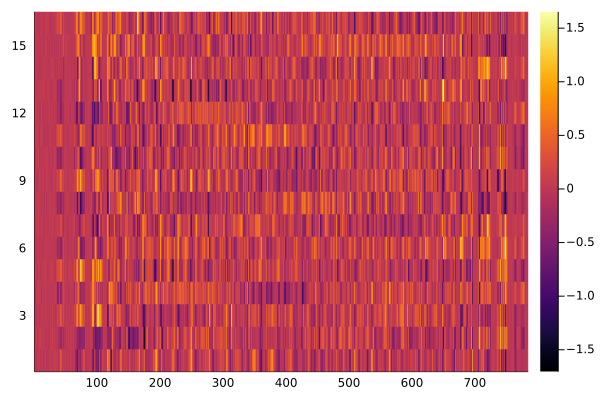

In [92]:
gr()
heatmap(ps[1])

In [71]:
#testing_model = Chain(
#    Dense(input_size, output_size, relu, init=(out, in)->ps[1], bias=ps[2]),
#    Dense(input_size, output_size, relu, init=(out, in)->ps[3], bias=ps[4]),
#    Dense(output_size, 10, init=(out, in)->ps[5], bias=ps[6]),
#    softmax
#)

In [72]:
#save("3_parameter_invariant_linear_model.jld", "A", data_model.A)
#R = load("9_parameter_invariant_model.jld")["A"]

In [94]:
println(accuracy(data_model.(test_x_vec), test_y_hot))

0.8818


In [387]:
params, restruct = Flux.destructure(data_model.models[1])
reparams = 10*randn(num_reparams)
testing_model = restruct(data_model.A*reparams)

Chain(
  Dense(784, 64),                       # 50_240 parameters
  Dense(64, 10),                        # 650 parameters
  NNlib.softmax,
)                   # Total: 4 arrays, 50_890 parameters, 397.828 KiB.

In [258]:
testing_model = Chain(
    Dense(input_size, output_size, relu, init=(out, in)->ps[1], bias=ps[2]),
    Dense(output_size, output_size, relu, init=(out, in)->ps[3], bias=ps[4]),
    Dense(output_size, 10, init=(out, in)->ps[5], bias=ps[6]),
    softmax
)

Chain(
  Dense(784, 128, relu),                # 100_480 parameters
  Dense(128, 128, relu),                # 16_512 parameters
  Dense(128, 10),                       # 1_290 parameters
  NNlib.softmax,
)                   # Total: 6 arrays, 118_282 parameters, 924.453 KiB.

In [388]:
print("ACCURACY: ")
println(accuracy(testing_model.(test_x_vec), test_y_hot))
testing_ps = Flux.params(testing_model)
ps = testing_ps

ACCURACY: 0.7036


Params([[0.0 -0.8427104682086516 … 12.623697898316813 -0.009599550210528662; 0.0 -1.3705528900676125 … 14.119799669330124 0.6521796488029554; … ; 0.0 1.1451361371262312 … -0.5421252362345084 -1.238090048127896; 0.0 -0.3087125467517283 … 1.3384449533926428 0.35283940517997575], [-5.629468201252818, -3.9590578828489478, 1.9493307513267975, 5.792216493053676, 0.1554551316588464, -4.6868261357504135, 0.38271933701279237, 4.045931670758211, -3.1072386109811867, -0.6557364615930317  …  -0.2782814221180101, -0.7974106800215197, 6.541803278178667, -3.2442849456704788, 2.9321109342280396, -0.8037834181899212, 3.8484669212929274, -2.023161295740625, -0.5764575923272077, -1.3243423218532766], [-9.402968950108235 -5.070832036875519 … -2.39159031943581 1.7714674392765328; -7.371631394155928 -20.09920598436499 … 13.052608753339815 -14.880348540473673; … ; -1.2313271213669439 3.1729591850493337 … -9.59783995259287 8.296104363240689; 1.4706670589374224 1.3511152753870512 … -3.0043638113795086 -7.82449

In [240]:
model_results = testing_model.(test_x_vec)

10000-element Vector{Vector{Float64}}:
 [0.18973680018170805, 0.019941809106289517, 0.12167139066570459, 0.11811375005099792, 0.10236190060323293, 0.07319434284788885, 0.2303389660042309, 0.04867603803309798, 0.09009644398411855, 0.005868558522730689]
 [0.02293650679050693, 0.004492020810732708, 0.3149657566294982, 0.038335203557563445, 0.35340574850659706, 0.0002146583625079434, 0.25271211325110055, 4.805272674038441e-5, 0.012861588748524822, 2.8350616227974428e-5]
 [0.14150414890372057, 0.10730814116040227, 0.07486739980190786, 0.36026996926357413, 0.07331287831733742, 0.03301392061080252, 0.10564484626576341, 0.01837135090766591, 0.055432786698120816, 0.03027455807070498]
 [0.1027109964645629, 0.012262066978684661, 0.12712715135322172, 0.1429596721584663, 0.22562340992438712, 0.1190767844261439, 0.13520705469159697, 0.021780942929886107, 0.11112626097992495, 0.002125660093125338]
 [0.09245175265932795, 0.021306748777972707, 0.10363657690306531, 0.09979515906822597, 0.135117959831171

In [186]:
test_y_hot

10000-element Vector{Flux.OneHotArray{UInt32, 10, 0, 1, UInt32}}:
 [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
 [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
 [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
 [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
 [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
 ⋮
 [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 1, 0]
 [0, 0, 0, 0, 0, 0, 0, 0, 0, 1]
 [1, 0, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 1, 0, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 1, 0, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 1, 0, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 1, 0, 0, 0, 0]
 [0, 0, 0, 0, 0, 0, 1, 0, 0, 0]

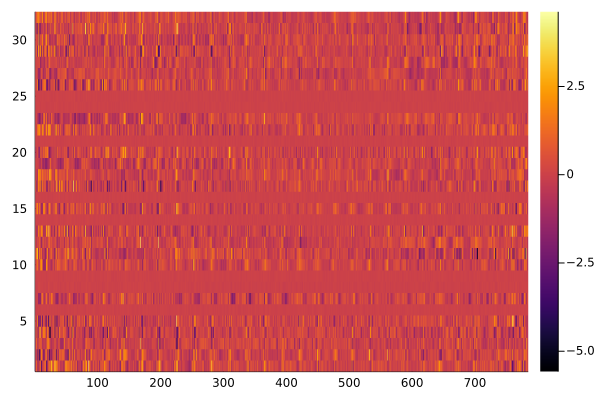

In [43]:
# Standard FFNN
gr()
heatmap(ps[1])

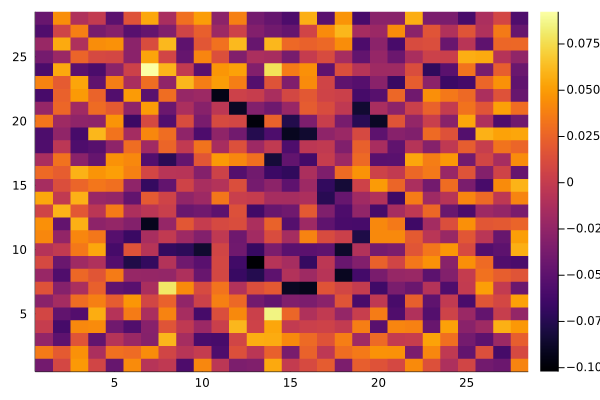

In [121]:
gr()
heatmap(reshape(ps[1][4, :], (28, 28)))
#ps[1][1, :]

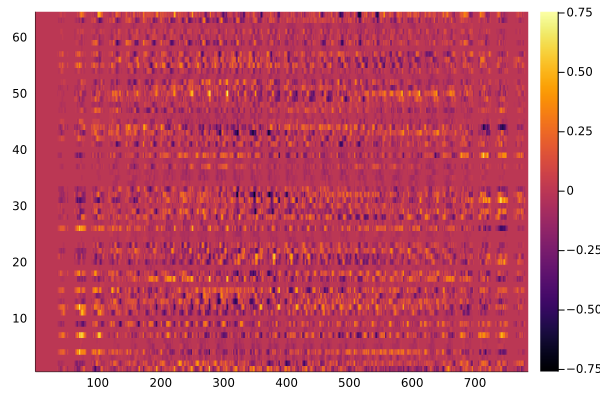

In [129]:
# rand_prob = .01, variance = 1/5
gr()
heatmap(ps[1])

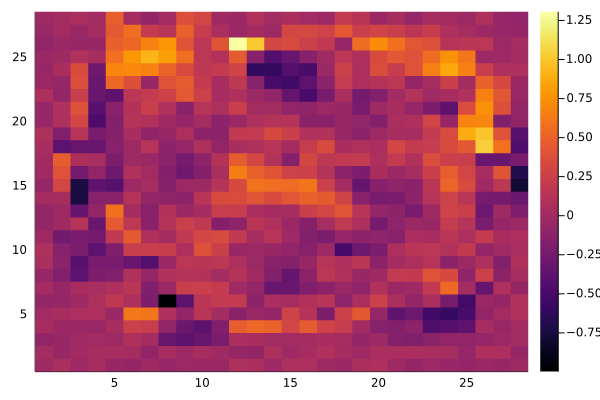

In [81]:
gr()
heatmap(reshape(ps[1][15, :], (28, 28)))

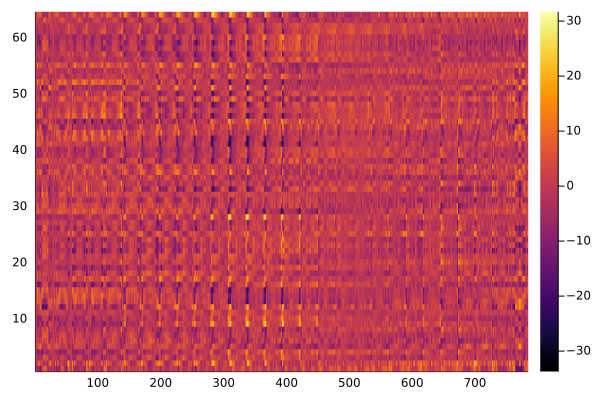

In [389]:
# rand_prob = .5, variance = 1/5
gr()
heatmap(ps[1])
#heatmap(1:size(data,1),
#    1:size(data,2), data,
#    c=cgrad([:blue, :white,:red, :yellow]),
#    xlabel="x values", ylabel="y values",
#    title="My title")

In [74]:
vec_set = ps[1]
distance_matrix = zeros((output_size, output_size))
for i = 1:output_size
    for j = 1:output_size
        ith = vec_set[i, :]
        jth = vec_set[j, :]
        distance_matrix[i, j] = exp(-dot(ith, jth)/(norm(ith)*norm(jth)))
    end
end

In [75]:
clust_y = hclust(distance_matrix)

Hclust{Float64}([-6 -24; -3 -26; … ; -29 29; -2 30], [0.5136594772338867, 0.5547940135002136, 0.6329441666603088, 0.6400764584541321, 0.6489059329032898, 0.6555712819099426, 0.6651806831359863, 0.6688827276229858, 0.6694034934043884, 0.6696203351020813  …  0.7110070586204529, 0.718375027179718, 0.7302660942077637, 0.7318877577781677, 0.7366374135017395, 0.7435509562492371, 0.7558127045631409, 0.8231271505355835, 0.9132181406021118, 0.9405009746551514], [2, 29, 12, 1, 30, 4, 27, 5, 21, 8  …  16, 23, 13, 31, 9, 18, 19, 28, 7, 17], :single)

In [428]:
num = input_size
distance_matrix = zeros((num, num))
for i = 1:num
    for j = 1:num
        ith = vec_set[:, i]
        jth = vec_set[:, j]
        distance_matrix[i, j] = exp(-dot(ith, jth)/((norm(ith) + .0001)*(norm(jth) + .0001)))
    end
end

In [429]:
clust_x = hclust(distance_matrix)

Hclust{Float64}([-253 -281; -14 -15; … ; -236 781; -1 782], [0.38099881619587317, 0.3855658190093085, 0.3861616906407428, 0.3861707394527475, 0.38818672941278826, 0.39103435594013547, 0.39372317454012257, 0.3959048849998933, 0.39706274952289455, 0.39810249396650893  …  0.5503959722080316, 0.5504949192766468, 0.5520707964973599, 0.5524989123137526, 0.5554070399982333, 0.5593842784651183, 0.5597083931347134, 0.5664588619190695, 0.5690766623592578, 0.5733315210956108], [1, 236, 32, 395, 532, 560, 588, 61, 97, 3  …  72, 70, 71, 182, 99, 183, 126, 127, 154, 155], :single)

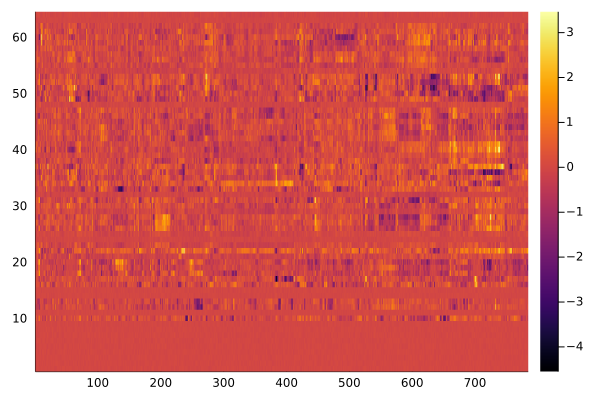

In [430]:
gr()
heatmap(ps[1][clust_y.order, clust_x.order])

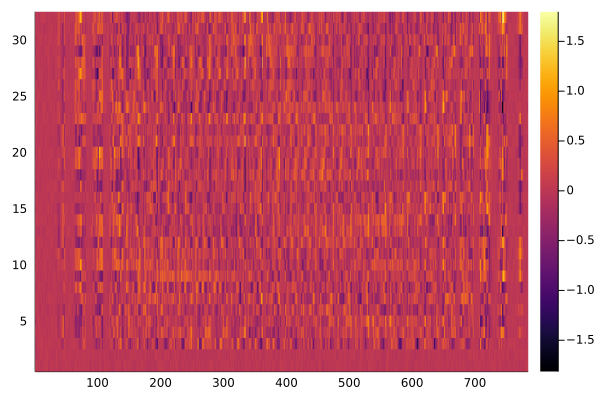

In [76]:
gr()
heatmap(ps[1][clust_y.order, :])

In [83]:
gr()
mat = ps[1][clust_y.order, :]
anim = @animate for i = 1:output_size
    heatmap(rotr90(rotr90(rotr90(reshape(mat[i, :], (28, 28))))), clim=(-1, 1), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_ruokuB", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000023.png", "000024.png", "000025.png", "000026.png", "000027.png", "000028.png", "000029.png", "000030.png", "000031.png", "000032.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
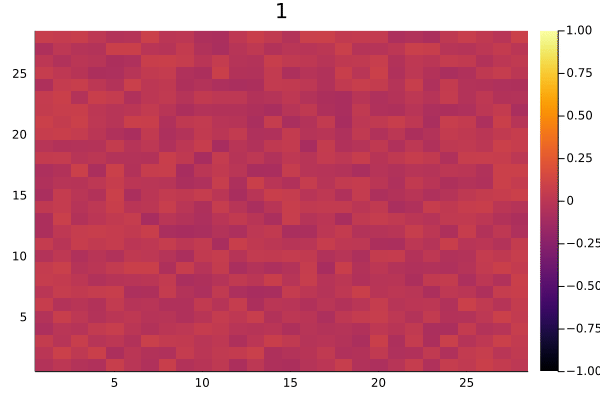

In [84]:
gif(anim, "tutorial_anim_fps30.gif", fps = 10)

In [244]:
gr()
mat = ps[1][clust_y.order, clust_x.order]
anim = @animate for i = 1:input_size
    heatmap(reshape(mat[:, i], (8, 8)), clim=(-.5, .5), title=i)
end
 

Animation("/var/folders/p4/z_tmb2f52hzf4k5l30hd_j_m0000gn/T/jl_bDG4Uq", ["000001.png", "000002.png", "000003.png", "000004.png", "000005.png", "000006.png", "000007.png", "000008.png", "000009.png", "000010.png"  …  "000775.png", "000776.png", "000777.png", "000778.png", "000779.png", "000780.png", "000781.png", "000782.png", "000783.png", "000784.png"])

┌ Info: Saved animation to 
│   fn = /Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif
└ @ Plots /Users/joshnunley/.julia/packages/Plots/kyYZF/src/animation.jl:104


Plots.AnimatedGif("/Users/joshnunley/src/evolve-parametrization/tutorial_anim_fps30.gif")
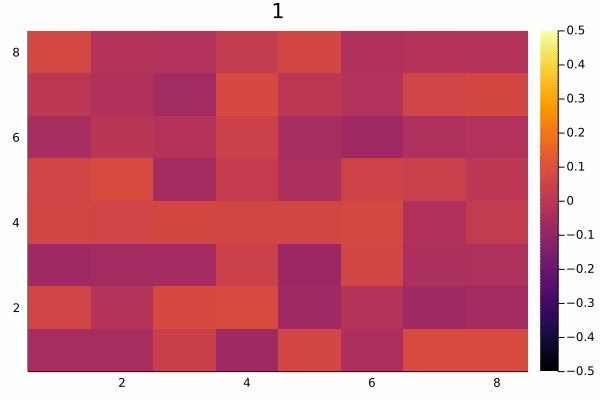

In [245]:
gif(anim, "tutorial_anim_fps30.gif", fps = 28)